# Определение стоимости автомобилей

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В нашем распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. Нам нужно построить модель для определения стоимости. 

Заказчику важны:

- качество предсказания;
- скорость предсказания;
- время обучения.

## Введение

Итак, начнём наше исследование. Прежде, чем приступить непосредственно к работе с данными, загрузим необходимые библиотеки.

### Библиотеки.

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import lightgbm as lgb

/Applications/anaconda3/envs/praktikum/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


А также отведём специальный раздел кода для написания функций, которые пригодятся в проекте.

### Функции.

In [2]:
def iqr(df, column):
    """
    Функция подсчитывает диапазон с учетом межквартильного размаха
    """ 
    iqr = df[column].describe()[6] - df[column].describe()[4] # считаем межквартильный размах
    low_bond = df[column].describe()[4] - 1.5 * iqr # подсчитываем нижнюю границу
    if low_bond < 0:        
        # бывает так, что нижняя граница уходит в минус, это означает, что ей можно присвоить минимум признака        
        low_bond = df[column].describe()[3]    
    upper_bond = df[column].describe()[6] + 1.5 * iqr # считаем верхнюю границу    
    print('Нижняя граница:', low_bond)
    print('Верхняя граница:', upper_bond)

### Обзор цели и задач.

<b>Цель</b> - сформировать оптимальнейшую модель машинного обучения с такими параметрами, которая даст наилучшую метрику RMSE на тестовых данных при предсказании цены на авто, при этом обучение и предсказание должны осуществляться за минимально возможное время, не теряя в качестве.

Предсказание будет основано на ретроспективных данных из объявлений о продаже авто с ценами (целевым признаком) и специфичными характеристиками (признаками).

<b>Задачи: </b>
- Ознакомиться и подготовить датасет к машиному обучению: обработать пропуски/странности при наличии, изучить корреляцию между признаками, проработать выбросы в целевом признаке при наличии
- Разделить выборку на обучающую, валидационную и тестовую, отделить целевой признак
- Обучить несколько разных видов моделей машинного обучения по задаче регрессии: случайный лес, простая линейная регрессия, градиентный бустинг (силами библиотеки LightGBM); пробовать изменять гиперпараметры для улучшения метрики качества
- При обучении и предсказаниях отмечать время работы алгоритмов
- Провести сравнительную характеристику моделей по трём параметрам: время обучения, время предсказания, RMSE; и выбрать модель с наилучшими показателями

## Подготовка данных

### Визуальный осмотр. Удаление ненужных данных.

In [3]:
# это, чтобы видеть все колонки датасетов:
pd.set_option('display.max_columns', None)

df = pd.read_csv("/Users/mihasia/Downloads/10_Opredelenie_stoimosti_avtomobiley_data.csv")
df.head()

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,NotRepaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21


<b>Лишние данные.</b>

В датасете имеется три колонки с полными датами: дата создания анкеты, дата скачивания анкеты из базы и дата последней активности пользователя. Так как инструмент, который мы разрабатываем, предполагает работу в реальном времени - пользователь вбивает характеристики авто и получает примерную цену - вряд ли стоит ожидать, что среди входных данных будет указано что-либо из перечисленного ("а вот сколько стоила бы моя машина, если бы я создал анкету в 2016 году, потом загрузил её в 2017, да ещё и активничал там в 2018?"). Безотносительно этого рассуждения, очень большие сомнения вызывает хоть сколько-нибудь значимое влияние данных признаков на целевой.

Предлагается удалить эти колонки, дабы не мешались на дороге.

In [4]:
df = df.drop(['DateCrawled', 'DateCreated', 'LastSeen'], axis=1)
df.head()

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,NotRepaired,NumberOfPictures,PostalCode
0,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,0,70435
1,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,0,66954
2,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,0,90480
3,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,0,91074
4,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,0,60437


На предмет "неуместности" для машинного обучения можно было бы ещё рассмотреть столбец с месяцем регистрации: всё же при продаже авто год регистрации имеет первостепенное значение. Чтобы разгрузить данные, допускаем, что месяц регистрации не оказывает большого влияния на цену авто, и удаляем этот столбец.

In [5]:
df = df.drop(['RegistrationMonth'], axis=1)
df.head()

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,FuelType,Brand,NotRepaired,NumberOfPictures,PostalCode
0,480,NaN,1993,manual,0,golf,150000,petrol,volkswagen,NaN,0,70435
1,18300,coupe,2011,manual,190,NaN,125000,gasoline,audi,yes,0,66954
2,9800,suv,2004,auto,163,grand,125000,gasoline,jeep,NaN,0,90480
3,1500,small,2001,manual,75,golf,150000,petrol,volkswagen,no,0,91074
4,3600,small,2008,manual,69,fabia,90000,gasoline,skoda,no,0,60437


Теперь посмотрим на информацию о типах данных и наличии пропусков.

### Обработка пропусков.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Price             354369 non-null  int64 
 1   VehicleType       316879 non-null  object
 2   RegistrationYear  354369 non-null  int64 
 3   Gearbox           334536 non-null  object
 4   Power             354369 non-null  int64 
 5   Model             334664 non-null  object
 6   Kilometer         354369 non-null  int64 
 7   FuelType          321474 non-null  object
 8   Brand             354369 non-null  object
 9   NotRepaired       283215 non-null  object
 10  NumberOfPictures  354369 non-null  int64 
 11  PostalCode        354369 non-null  int64 
dtypes: int64(6), object(6)
memory usage: 32.4+ MB


Все числовые данные в целочисленном формате, все текстовые справедливо отнесены к объектам. Пропуски имеются в столбцах:

- Тип кузова
- Тип коробки передач
- Модель
- Тип топлива
- Факт нахождения в ремонте

Посмотрим на них на всех по очереди.

#### Тип кузова.

In [7]:
print('Типы кузова и их представленность в данных:\n', df['VehicleType'].value_counts())
print('\nПропусков в столбце "Тип кузова":', df['VehicleType'].isna().sum())

Типы кузова и их представленность в данных:
 sedan          91457
small          79831
wagon          65166
bus            28775
convertible    20203
coupe          16163
suv            11996
other           3288
Name: VehicleType, dtype: int64

Пропусков в столбце "Тип кузова": 37490


Пропусков довольно много, терять такое количество строк не хотелось бы. Восстановить тип кузова по тем характеристикам, что у нас есть, невозможно: одна и та же марка и модель может выпускаться в разных типах кузова. Среди представленных типов есть неплохая, уже заполненная, категория "other". Посмотрим, что в ней интересного.

In [8]:
df[df['VehicleType'] == 'other'].sample(15)

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,FuelType,Brand,NotRepaired,NumberOfPictures,PostalCode
98003,700,other,2000,manual,65,corsa,5000,NaN,opel,no,0,44267
190974,140,other,1996,manual,140,3er,150000,petrol,bmw,no,0,64665
82178,980,other,1998,NaN,0,corsa,150000,petrol,opel,NaN,0,47228
130625,7500,other,2008,manual,122,1er,80000,petrol,bmw,no,0,46119
52130,650,other,1997,manual,64,caddy,150000,gasoline,volkswagen,NaN,0,99958
141157,3900,other,1970,manual,0,transporter,150000,petrol,volkswagen,yes,0,76287
263481,2950,other,2003,manual,95,kangoo,150000,petrol,renault,no,0,21720
104465,11500,other,1998,manual,300,corsa,50000,NaN,opel,no,0,33739
293648,1500,other,1996,manual,90,golf,150000,petrol,volkswagen,NaN,0,38100
280177,790,other,2002,manual,0,fiesta,150000,gasoline,ford,yes,0,44536


В категории 'other' попадаются довольно популярные модели (Например, Гольф), у которых тип кузова стопроцентно относится к какому-то из имеющихся типов - седан, универсал и пр. Значит, в этой категории не обязательно находятся авто, у которых какой-то особенный и оригинальный тип кузова, и тогда мы можем наши пропуски отнести сюда же, в 'other'.

In [9]:
df['VehicleType'] = df['VehicleType'].fillna(value='other')
print('Типы кузова и их представленность в данных:\n', df['VehicleType'].value_counts())
print('\nПропусков в столбце "Тип кузова":', df['VehicleType'].isna().sum())

Типы кузова и их представленность в данных:
 sedan          91457
small          79831
wagon          65166
other          40778
bus            28775
convertible    20203
coupe          16163
suv            11996
Name: VehicleType, dtype: int64

Пропусков в столбце "Тип кузова": 0


#### Тип коробки передач.

In [10]:
print('Типы коробки передач и их представленность в данных:\n', df['Gearbox'].value_counts())
print('\nПропусков в столбце "Тип коробки передач":', df['Gearbox'].isna().sum())

Типы коробки передач и их представленность в данных:
 manual    268251
auto       66285
Name: Gearbox, dtype: int64

Пропусков в столбце "Тип коробки передач": 19833


Ситуация похожа на предыдущую характеристику, за тем исключением, что нет категории "other". 19833 строки против 354369 - это больше 5.5 % данных, многовато.  Опять же, тип коробки из наших данных не вытащить, поэтому создадим сами категорию 'other', и заполним ею пропуски.

In [11]:
df['Gearbox'] = df['Gearbox'].fillna(value='other')
print('Типы коробки передач и их представленность в данных:\n', df['Gearbox'].value_counts())
print('\nПропусков в столбце "Тип коробки передач":', df['Gearbox'].isna().sum())

Типы коробки передач и их представленность в данных:
 manual    268251
auto       66285
other      19833
Name: Gearbox, dtype: int64

Пропусков в столбце "Тип коробки передач": 0


#### Модель.

In [12]:
print('Названия моделей авто и их представленность в данных:\n', df['Model'].unique())
print('\nПропусков в столбце "Модель":', df['Model'].isna().sum())

Названия моделей авто и их представленность в данных:
 ['golf' nan 'grand' 'fabia' '3er' '2_reihe' 'other' 'c_max' '3_reihe'
 'passat' 'navara' 'ka' 'polo' 'twingo' 'a_klasse' 'scirocco' '5er'
 'meriva' 'arosa' 'c4' 'civic' 'transporter' 'punto' 'e_klasse' 'clio'
 'kadett' 'kangoo' 'corsa' 'one' 'fortwo' '1er' 'b_klasse' 'signum'
 'astra' 'a8' 'jetta' 'fiesta' 'c_klasse' 'micra' 'vito' 'sprinter' '156'
 'escort' 'forester' 'xc_reihe' 'scenic' 'a4' 'a1' 'insignia' 'combo'
 'focus' 'tt' 'a6' 'jazz' 'omega' 'slk' '7er' '80' '147' '100' 'z_reihe'
 'sportage' 'sorento' 'v40' 'ibiza' 'mustang' 'eos' 'touran' 'getz' 'a3'
 'almera' 'megane' 'lupo' 'r19' 'zafira' 'caddy' 'mondeo' 'cordoba' 'colt'
 'impreza' 'vectra' 'berlingo' 'tiguan' 'i_reihe' 'espace' 'sharan'
 '6_reihe' 'panda' 'up' 'seicento' 'ceed' '5_reihe' 'yeti' 'octavia' 'mii'
 'rx_reihe' '6er' 'modus' 'fox' 'matiz' 'beetle' 'c1' 'rio' 'touareg'
 'logan' 'spider' 'cuore' 's_max' 'a2' 'galaxy' 'c3' 'viano' 's_klasse'
 '1_reihe' 'avensi

Категория "other" тут тоже есть, запишем пропуски туда. Ещё есть двоякое написание Range rover, поправим.

In [13]:
df['Model'] = df['Model'].fillna(value='other')
df['Model'] = df['Model'].replace(['rangerover'], 'range_rover')
print('\nПропусков в столбце "Модель":', df['Model'].isna().sum())


Пропусков в столбце "Модель": 0


#### Тип топлива.

In [14]:
print('Типы топлива и их представленность в данных:\n', df['FuelType'].value_counts())
print('\nПропусков в столбце "Тип топлива":', df['FuelType'].isna().sum())

Типы топлива и их представленность в данных:
 petrol      216352
gasoline     98720
lpg           5310
cng            565
hybrid         233
other          204
electric        90
Name: FuelType, dtype: int64

Пропусков в столбце "Тип топлива": 32895


Как и в предыдущих разделах, здесь имеется внушительное количество пропусков, которое жалко удалять. Также с прискорбием (для окружающей среды) можно отметить, что подавляющее большинство проданных авто работают на бензине, причём обозначен он в данных двумя способами: petrol и gasoline. Так как численность авто на прочих видах топлива ничтожно мала по сравнению с бензиновыми экземплярами, предлагается заменить пропуски на данный вид топлива. И дополнительно унифицировать название для этой категории.

In [15]:
df['FuelType'] = df['FuelType'].fillna(value='petrol')
df['FuelType'] = df['FuelType'].replace(['gasoline'], 'petrol')
print('Типы топлива и их представленность в данных:\n', df['FuelType'].value_counts())
print('\nПропусков в столбце "Тип топлива":', df['FuelType'].isna().sum())

Типы топлива и их представленность в данных:
 petrol      347967
lpg           5310
cng            565
hybrid         233
other          204
electric        90
Name: FuelType, dtype: int64

Пропусков в столбце "Тип топлива": 0


#### Бренд.

В этом признаке пропусков не было, но нужно хотя бы бегло просмотреть список уникальных брендов на предмет ошибок.

In [16]:
df['Brand'].unique()

array(['volkswagen', 'audi', 'jeep', 'skoda', 'bmw', 'peugeot', 'ford',
       'mazda', 'nissan', 'renault', 'mercedes_benz', 'opel', 'seat',
       'citroen', 'honda', 'fiat', 'mini', 'smart', 'hyundai',
       'sonstige_autos', 'alfa_romeo', 'subaru', 'volvo', 'mitsubishi',
       'kia', 'suzuki', 'lancia', 'toyota', 'chevrolet', 'dacia',
       'daihatsu', 'trabant', 'saab', 'chrysler', 'jaguar', 'daewoo',
       'porsche', 'rover', 'land_rover', 'lada'], dtype=object)

Вроде всё ок.

#### Факт нахождения в ремонте.

In [17]:
print('Факт нахождения в ремонте, виды значений и их представленность:\n', df['NotRepaired'].value_counts())
print('\nПропусков в столбце "Факт нахождения в ремонте":', df['NotRepaired'].isna().sum())

Факт нахождения в ремонте, виды значений и их представленность:
 no     247161
yes     36054
Name: NotRepaired, dtype: int64

Пропусков в столбце "Факт нахождения в ремонте": 71154


Пропусков в этом столбце в два раза больше, чем заполненных значений по одной из категорий, это очень и очень большой объем. 

Можно было бы предположить, что, отсутствие сведений о ремонте - суть отсутствие ремонта, и тогда заполнить пустые ячейки ответом "yes". Но здесь смущает само название столбца, где почему-то стоит отрицание. А вдруг отсутствие данных - это отсутствие отсутствия ремонта, то есть ремонт?

Любая из замен всех пропусков строго на одно значение приведёт к значительному смещению пропорции ответов, что, вероятно, не очень хорошо может повлиять на результат. Придётся добавить категорию "unknown", и это вполне может соответствовать действительности. Могут же люди скрывать/не знать (если владелец не первый)/не обратить внимание на эту графу в анкете.

<b>Здесь у меня была ещё одна идея - рандомно заполнить пропуски значениями "yes" и "no", при этом соблюдая текущую пропорцию между ними. Но пока не удалось реализовать задуманное, и пришлось остановиться на создании третьей категории. </b>

In [18]:
df['NotRepaired'] = df['NotRepaired'].fillna(value='unknown')
print('Факт нахождения в ремонте, виды значений и их представленность:\n', df['NotRepaired'].value_counts())
print('\nПропусков в столбце "Факт нахождения в ремонте":', df['NotRepaired'].isna().sum())

Факт нахождения в ремонте, виды значений и их представленность:
 no         247161
unknown     71154
yes         36054
Name: NotRepaired, dtype: int64

Пропусков в столбце "Факт нахождения в ремонте": 0


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Price             354369 non-null  int64 
 1   VehicleType       354369 non-null  object
 2   RegistrationYear  354369 non-null  int64 
 3   Gearbox           354369 non-null  object
 4   Power             354369 non-null  int64 
 5   Model             354369 non-null  object
 6   Kilometer         354369 non-null  int64 
 7   FuelType          354369 non-null  object
 8   Brand             354369 non-null  object
 9   NotRepaired       354369 non-null  object
 10  NumberOfPictures  354369 non-null  int64 
 11  PostalCode        354369 non-null  int64 
dtypes: int64(6), object(6)
memory usage: 32.4+ MB


Пропусков больше нет. Посмотрим теперь на числа, поищем аномалии и выбросы.

### Аномалии и выбросы.

In [20]:
# всякие пределы и квантили для датасета, для общего развития
df.describe()

,Price,RegistrationYear,Power,Kilometer,NumberOfPictures,PostalCode
count,354369.000000,354369.000000,354369.000000,354369.000000,354369.0,354369.000000
mean,4416.656776,2004.234448,110.094337,128211.172535,0.0,50508.689087
std,4514.158514,90.227958,189.850405,37905.341530,0.0,25783.096248
min,0.000000,1000.000000,0.000000,5000.000000,0.0,1067.000000
25%,1050.000000,1999.000000,69.000000,125000.000000,0.0,30165.000000
50%,2700.000000,2003.000000,105.000000,150000.000000,0.0,49413.000000
75%,6400.000000,2008.000000,143.000000,150000.000000,0.0,71083.000000
max,20000.000000,9999.000000,20000.000000,150000.000000,0.0,99998.000000


Посмотрим по очереди на числовые признаки на предмет странностей - всё же они довольно разношёрстные, чтобы применять на них какую-то однобокую предобработку.

#### Цена. Целевой признак.

Это наш самый главный-преглавный признак. Аккуратно его осмотрим и подлатаем. Взглянем на распределение.

In [26]:
fig = px.histogram(df, x = 'Price', marginal = 'box', title = 'Price')

fig.show(renderer="svg")    
print('Адекватный диапазон значений признака Price')
iqr(df, 'Price')

Адекватный диапазон значений признака Price
Нижняя граница: 0.0
Верхняя граница: 14425.0


Бесплатный сыр (машина) - только на свалке. Нижний квантиль нам не помощник для обрезания выбросов, возьмём, например, отметку в 200 евро. Это очень грубо равно 20000 рублей - нижней планке для б/у автомобилей на популярном ресурсе auto.ru.

Что касается верхней границы, то 20 000 евро - это ещё не предел стоимости авто, даже подержанного. На том же авто.ру есть экземпляры по 800 000. Но выбросы - есть выбросы, для обучения лучше без запредельных значений.

In [27]:
df = df.drop(df.query('Price > 14425 | Price < 200').index)
del fig

#### Год регистрации.

Очевидно, что верхняя граница у нас не должна быть больше 2021, посмотрим, как разместятся квантили.

In [28]:
fig = px.histogram(df, x = 'RegistrationYear', marginal = 'box', title = 'RegistrationYear')
fig.show(renderer="svg")    
print('Адекватный диапазон значений признака RegistrationYear')
iqr(df, 'RegistrationYear')

Адекватный диапазон значений признака RegistrationYear
Нижняя граница: 1987.0
Верхняя граница: 2019.0


Отлично разместились, выглядит вполне правдоподобно, будем обрезать всё за этими рамкамии, благо обрезать не так много.

In [29]:
df = df.drop(df.query('RegistrationYear > 2021 | RegistrationYear < 1985').index)

#### Мощность (л.с.).

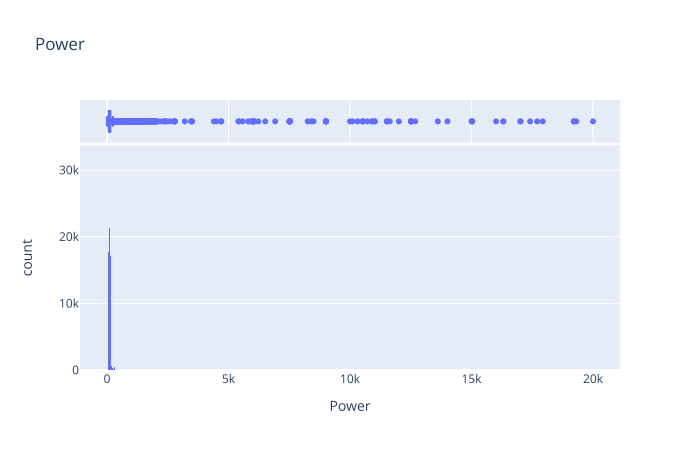

Адекватный диапазон значений признака Power
Нижняя граница: 0.0
Верхняя граница: 246.5


In [30]:
fig = px.histogram(df, x = 'Power', marginal = 'box', title = 'Power')
fig.show(renderer="svg")    
print('Адекватный диапазон значений признака Power')
iqr(df, 'Power')

На том же авто.ру есть маленькие электромобили с мощностью всего в 10 лошадиных сил. Пусть это будет нижней границей. Верхнюю границу возьмём из верхнего квантиля, хоть бывают машинки и помощнее. 

In [31]:
df = df.drop(df.query('Power > 248 | Power < 10').index)

#### Пробег.

In [32]:
fig = px.histogram(df, x = 'Kilometer', marginal = 'box', title = 'Kilometer')
fig.show(renderer="svg")    
print('Адекватный диапазон значений признака Kilometer')
iqr(df, 'Kilometer')

Адекватный диапазон значений признака Kilometer
Нижняя граница: 87500.0
Верхняя граница: 187500.0


Здесь не хочется ничего обрезать, все границы выглядят адекватными, пробег 5000 тоже имеет право на существование, тем более, в датасете есть совсем свежие автомобили.

In [33]:
del fig

#### Количество фотографий в анкете.

Уже из общей статистической таблицы было видно, что это просто столбец со сплошными нулями. Вероятно, этот признак просто не прогрузился на каком-то из этапов переноса данных. 

In [34]:
df['NumberOfPictures'].describe()

count    276029.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: NumberOfPictures, dtype: float64

Одинаковые значения никак не помогут в обучении, поэтому данный признак придётся удалить.

In [35]:
df = df.drop(['NumberOfPictures'], axis=1)

#### Почтовый индекс.

Распределение данного признака смотреть не имеет смысла, это всё же больше объектный тип данных, обозначающий местоположения. Индексы могут содержать разное количество цифр, поэтому 4-хсимвольные индексы странными не кажутся. Если бы в столбце присутствовали более экзотичные варианты, добавления символов, букв, питон бы не определил этот признак как числовой. Проверить реальность существования всех этих индексов - отдельная ресурсоёмкая задача. Учитывая количество данных, процент ошибок не должен быть значимо большим, поэтому предположим, что индексы в анкетах заполнялись либо автоматически по расположению ip компьютера, либо пользователи указывали населённый пункт, а индекс проставлялся сам. Это допущение позволит понадеяться, что ошибок там нет :)

Во-вторых, если бы мы делали некую визуальную отчётность по продажам в разных регионах, можно было бы заменить индексы на названия населённых пунктов, но бездушная машина примет и это. Главное - не забыть, что это категориальный признак, и закодировать его как все текстовые признаки перед обучением.

### Подготовка признаков.

Взглянем, что у нас осталось после обрезаний.

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 276029 entries, 2 to 354368
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Price             276029 non-null  int64 
 1   VehicleType       276029 non-null  object
 2   RegistrationYear  276029 non-null  int64 
 3   Gearbox           276029 non-null  object
 4   Power             276029 non-null  int64 
 5   Model             276029 non-null  object
 6   Kilometer         276029 non-null  int64 
 7   FuelType          276029 non-null  object
 8   Brand             276029 non-null  object
 9   NotRepaired       276029 non-null  object
 10  PostalCode        276029 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 25.3+ MB


Удалось сохранить почти 300к объектов, это хороший результат.

#### Корреляция признаков.

Посмотрим на матрицу корреляций числовых признаков.

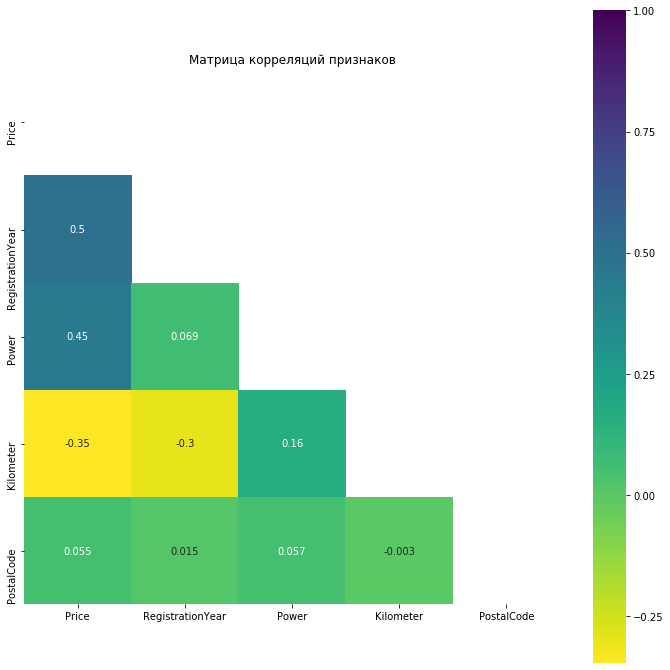

In [37]:
# это чтобы матрица была треугольная
mask = np.triu(df.corr())
# строим матрицу
figure, ax = plt.subplots(figsize=(12,12))
figure = (sns.heatmap(df.corr(), square=True, mask=mask,
                     xticklabels=1, yticklabels=1, ax=ax, cmap='viridis_r', annot=True)
 .set_title('Матрица корреляций признаков')
)

С целевым признаком - ценой - неплохо коррелируют мощность и год выпуска, что вовсе не вызывает удивления. Удалять эти признаки не хотелось бы, тем более, что они не дотягивают до условного порога в 0.7, после которого действительно стоит задуматься об удалении.

И да, видны логичные отрицательные корреляции пробег-цена и пробег-год регистрации.

In [38]:
del figure
del mask

#### Кодирование категориальных признаков.

Цена - количественный целевой признак, решаем задачу регрессии. Следовательно, нам нужно, чтобы все признаки в том или ином виде стали количественными. Для признаков типа объект нужно применить кодирование.

Здесь подойдёт кодирование OrdinalEncoding, потому что <s>я попробовала OHE и уронила kernel</s> некоторые категориальные признаки, такие как почтовый индекс или модель авто, содержат в себе ну очень много категорий, и это плодит много новых столбцов. А порядковое кодирование оставляет за собой всего один столбец. 

In [39]:
encoder = OrdinalEncoder()
df[['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'NotRepaired', 'PostalCode']] = encoder.fit_transform(
    df[['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'NotRepaired', 'PostalCode']])

In [40]:
df.head()

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,FuelType,Brand,NotRepaired,PostalCode
2,9800,6.0,2004,0.0,163,117.0,125000,5.0,14.0,1.0,6954.0
3,1500,5.0,2001,1.0,75,116.0,150000,5.0,38.0,0.0,6994.0
4,3600,5.0,2008,1.0,69,101.0,90000,5.0,31.0,0.0,4188.0
5,650,4.0,1995,1.0,102,11.0,150000,5.0,2.0,2.0,2361.0
6,2200,1.0,2004,1.0,109,8.0,150000,5.0,25.0,0.0,4611.0


Выглядит неплохо. Идём дальше.

#### Разделение выборки и признаков.

Обучать будем на обучающей, валидировать - на валидационной выборке.

In [41]:
df_train, df_valid = train_test_split(df, test_size = 0.25, random_state=42)
print("Размеры полученных выборок:")
print("Обучающая:", df_train.shape, '\n',
      "Валидационная:", df_valid.shape, '\n')

Размеры полученных выборок:
Обучающая: (207021, 11) 
 Валидационная: (69008, 11) 



Целевой признак - цена, отлепим его от обеих выборок.

In [42]:
features_train = df_train.drop('Price', axis=1)
target_train = df_train['Price']
features_valid = df_valid.drop('Price', axis=1)
target_valid = df_valid['Price']
print(features_train.head())

        VehicleType  RegistrationYear  Gearbox  Power  Model  Kilometer  \
353085          4.0              2007      1.0     60  173.0     125000   
350344          3.0              2016      1.0    125  166.0     150000   
51193           4.0              2007      1.0    102  140.0     100000   
198427          7.0              2008      1.0    232   29.0     150000   
235974          7.0              1996      0.0    110   29.0     150000   

        FuelType  Brand  NotRepaired  PostalCode  
353085       5.0   38.0          1.0      1363.0  
350344       5.0   38.0          0.0      2543.0  
51193        5.0   30.0          0.0       310.0  
198427       5.0    1.0          0.0      6208.0  
235974       5.0    1.0          2.0      1922.0  


Пора идти учиться.

## Обучение моделей

Попробуем случайный лес, обычную линейную регрессию и градиентный бустинг. И сделаем дамми-предсказания, чтобы проверить адекватность выигравшей гонку модели.

### Случайный лес.

Сначала отмасштабируем количественные признаки.

In [43]:
scaler = StandardScaler()
scaler.fit(features_train[['RegistrationYear', 'Power', 'Kilometer']])
features_train_scaled = features_train.copy()
features_valid_scaled = features_valid.copy()

features_train_scaled[['RegistrationYear', 'Power', 'Kilometer']] = scaler.transform(
    features_train[['RegistrationYear', 'Power', 'Kilometer']])
features_valid_scaled[['RegistrationYear', 'Power', 'Kilometer']] = scaler.transform(
    features_valid[['RegistrationYear', 'Power', 'Kilometer']])

Теперь подберём поочередно глубину деревьев и их количество, затем ещё раз уточним глубину.

In [44]:
best_model_RandomForest = None
best_model_RandomForest_depth = 0
best_RMSE_RandomForest = 10000


# ищем оптимальную глубину дерева от 0 до 20
for depth in range(1,21):    
    model_RandomForest = RandomForestRegressor(random_state=42, max_depth=depth, n_estimators=20)
    model_RandomForest.fit(features_train_scaled, target_train)
    predictions_valid = model_RandomForest.predict(features_valid_scaled)
    # RMSE calculation
    RMSE_RandomForest = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_RandomForest < best_RMSE_RandomForest:
        best_model_RandomForest = model_RandomForest
        best_RMSE_RandomForest = RMSE_RandomForest        
        best_model_RandomForest_depth = model_RandomForest.get_params().get('max_depth')  

print("RMSE модели с наилучшей глубиной дерева:\n", 
      best_RMSE_RandomForest)
print("Лучшая глубина в модели случайного леса:", best_model_RandomForest_depth) 

RMSE модели с наилучшей глубиной дерева:
 1262.5543586707417
Лучшая глубина в модели случайного леса: 20


In [45]:
best_model_RandomForest = None
best_model_RandomForest_esimators = 0
best_RMSE_RandomForest = 10000


# ищем оптимальное количество оценщиков с глубиной 20, проверяя числа от 1 до 101 с шагом в 10
for estimators in range(1,101, 10):    
    model_RandomForest = RandomForestRegressor(random_state=42, max_depth=20, n_estimators=estimators)
    model_RandomForest.fit(features_train_scaled, target_train)
    predictions_valid = model_RandomForest.predict(features_valid_scaled)
    # RMSE calculation
    RMSE_RandomForest = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_RandomForest < best_RMSE_RandomForest:
        best_model_RandomForest = model_RandomForest
        best_RMSE_RandomForest = RMSE_RandomForest        
        best_model_RandomForest_estimators = model_RandomForest.get_params().get('n_estimators')  

print("RMSE модели с наилучшей глубиной дерева:\n", 
      best_RMSE_RandomForest)
print("Лучшее количество оценщиков в модели случайного леса:", best_model_RandomForest_estimators) 

RMSE модели с наилучшей глубиной дерева:
 1244.7442945009923
Лучшее количество оценщиков в модели случайного леса: 91


In [46]:
best_model_RandomForest = None
best_model_RandomForest_depth = 0
best_RMSE_RandomForest = 10000


# заново ищем оптимальную глубину дерева, но с другим количеством оценщиков

for depth in range(20, 30):    
    model_RandomForest = RandomForestRegressor(random_state=42, max_depth=depth, n_estimators=90)
    model_RandomForest.fit(features_train_scaled, target_train)
    predictions_valid = model_RandomForest.predict(features_valid_scaled)
    # RMSE calculation
    RMSE_RandomForest = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_RandomForest < best_RMSE_RandomForest:
        best_model_RandomForest = model_RandomForest
        best_RMSE_RandomForest = RMSE_RandomForest        
        best_model_RandomForest_depth = model_RandomForest.get_params().get('max_depth')  

print("RMSE модели с наилучшей глубиной дерева:\n", 
      best_RMSE_RandomForest)
print("Лучшая глубина в модели случайного леса:", best_model_RandomForest_depth) 

RMSE модели с наилучшей глубиной дерева:
 1243.24734789703
Лучшая глубина в модели случайного леса: 23


Значения RMSE интересные. Посмотрим ещё, сколько времени она обучается и предсказывает.

In [47]:
%%time
model_RandomForest = RandomForestRegressor(random_state=42, max_depth=23, n_estimators=90)
model_RandomForest.fit(features_train_scaled, target_train)
predictions_valid = model_RandomForest.predict(features_valid_scaled)

CPU times: user 1min 22s, sys: 1.93 s, total: 1min 24s
Wall time: 1min 29s


In [48]:
RMSE_RandomForest = (mean_squared_error(target_valid, predictions_valid))**0.5
print("RMSE модели случайного леса:\n", 
      RMSE_RandomForest)

RMSE модели случайного леса:
 1243.24734789703


Долговато. Посмотрим на качество и время работы модели простой линейной регрессии.

In [49]:
del best_model_RandomForest
del best_model_RandomForest_depth
del best_RMSE_RandomForest
del best_model_RandomForest_estimators

### Линейная регрессия.

In [50]:
%%time
model_LinearRegression = LinearRegression()
model_LinearRegression.fit(features_train_scaled, target_train)
predictions_valid = model_LinearRegression.predict(features_valid_scaled)

CPU times: user 104 ms, sys: 61.3 ms, total: 165 ms
Wall time: 231 ms


In [51]:
RMSE_LinearRegression = (mean_squared_error(target_valid, predictions_valid))**0.5
print("RMSE модели простой линейной регрессии:\n", 
      RMSE_LinearRegression)

RMSE модели простой линейной регрессии:
 2312.0227512696383


Работает побыстрее, качество хуже. Нужно стараться сделать функцию потерь (а здесь у нас это RMSE) как можно меньше. В этом нам должен помочь градиентный бустинг, попробуем разобраться, что за зверь, силами библиотеки LightGBM.

### Градиентный бустинг.

Эта замечательная библиотека даже не просит кодировать категориальные признаки способом OHE, лишь просит конвертировать объекты в integer, а мы уже это сделали ранее, довольно удобно вышло! 

Кажется, для решения задачи регрессии тут подходит модель LightGBM regressor. Обучим и предскажем, пока с гиперпараметрами по умолчанию.

In [52]:
%%time
model_GradientBoosting = lgb.LGBMRegressor()
model_GradientBoosting.fit(features_train, target_train)
predictions_valid = model_GradientBoosting.predict(features_valid)

CPU times: user 5.37 s, sys: 372 ms, total: 5.74 s
Wall time: 2.07 s


In [53]:
RMSE_GradientBoosting = (mean_squared_error(target_valid, predictions_valid))**0.5
print("RMSE модели градиентного бустинга:\n", 
      RMSE_GradientBoosting)

RMSE модели градиентного бустинга:
 1347.4487557608231


Метрика больше, чем у простой модели случайного леса, но считает в разы быстрее. Попробуем покрутить какие-нибудь гиперпараметры. Сначала глубину дерева.

In [54]:
best_model_GradientBoosting = None
best_model_GradientBoosting_depth = 0
best_RMSE_GradientBoosting = 10000

for depth in range(1, 30):    
    model_GradientBoosting = lgb.LGBMRegressor(max_depth = depth, random_state=42)
    model_GradientBoosting.fit(features_train, target_train)
    predictions_valid = model_GradientBoosting.predict(features_valid)
    # RMSE calculation
    RMSE_GradientBoosting = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_GradientBoosting < best_RMSE_GradientBoosting:
        best_model_GradientBoosting = model_GradientBoosting
        best_RMSE_GradientBoosting = RMSE_GradientBoosting        
        best_model_GradientBoosting_depth = model_GradientBoosting.get_params().get('max_depth')  

print("RMSE модели с наилучшей глубиной дерева:\n", 
      best_RMSE_GradientBoosting)
print("Лучшая глубина в модели градиентного бустинга:", best_model_GradientBoosting_depth) 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

In [55]:
learn_rate = [0.001, 0.01, 0.1, 0.2, 0.3, 0.5, 0.6, 0.8, 0.9]
best_model_GradientBoosting = None
best_model_GradientBoosting_learning_rate = 0
best_RMSE_GradientBoosting = 10000

for i in range(len(learn_rate)):    
    model_GradientBoosting = lgb.LGBMRegressor(max_depth = 16, learning_rate=learn_rate[i], random_state=42)
    model_GradientBoosting.fit(features_train, target_train)
    predictions_valid = model_GradientBoosting.predict(features_valid)
    # RMSE calculation
    RMSE_GradientBoosting = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_GradientBoosting < best_RMSE_GradientBoosting:
        best_model_GradientBoosting = model_GradientBoosting
        best_RMSE_GradientBoosting = RMSE_GradientBoosting        
        best_model_GradientBoosting_learning_rate = model_GradientBoosting.get_params().get('learning_rate')  

print("RMSE модели с наилучшей скоростью обучения:\n", 
      best_RMSE_GradientBoosting)
print("Лучшая скорость обучения в модели градиентного бустинга:", best_model_GradientBoosting_learning_rate) 


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

Неплохо, мы немного приблизились к метрике леса. И скорость обучения получилась средней между высокой точностью и медлительностью и никой точностью и быстротой. Осталось поиграть с количеством деревьев.

In [56]:
best_model_GradientBoosting = None
best_model_GradientBoosting_n_estimators = 0
best_RMSE_GradientBoosting = 10000

for estimators in range(1, 201, 10):    
    model_GradientBoosting = lgb.LGBMRegressor(max_depth = 16, 
                                               learning_rate = 0.5, 
                                               random_state = 42,
                                              n_estimators = estimators)
    model_GradientBoosting.fit(features_train, target_train)
    predictions_valid = model_GradientBoosting.predict(features_valid)
    # RMSE calculation
    RMSE_GradientBoosting = (mean_squared_error(target_valid, predictions_valid))**0.5
   
    
    # choice of best RMSE
    if RMSE_GradientBoosting < best_RMSE_GradientBoosting:
        best_model_GradientBoosting = model_GradientBoosting
        best_RMSE_GradientBoosting = RMSE_GradientBoosting        
        best_model_GradientBoosting_n_estimators = model_GradientBoosting.get_params().get('n_estimators')  

print("RMSE модели с наилучшим количеством деревьев:\n", 
      best_RMSE_GradientBoosting)
print("Лучшее количество деревьев в модели градиентного бустинга:", best_model_GradientBoosting_n_estimators) 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

Хороший результат. Проверим итоговое время работы этой модели с подобранными гиперпараметрами.

In [57]:
%%time
model_GradientBoosting = lgb.LGBMRegressor(max_depth = 16, 
                                               learning_rate = 0.5, 
                                               random_state = 42,
                                              n_estimators = 191)
model_GradientBoosting.fit(features_train, target_train)
predictions_valid = model_GradientBoosting.predict(features_valid)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
CPU times: user 6.92 s, sys: 635 ms, total: 7.56 s
Wall time: 2.72 s


In [58]:
RMSE_GradientBoosting = (mean_squared_error(target_valid, predictions_valid))**0.5
print("RMSE модели градиентного бустинга:\n", 
      RMSE_GradientBoosting)

RMSE модели градиентного бустинга:
 1269.7291653458692


## Анализ моделей

Итак, мы попробовали три модели, посчитали для каждой лучшие параметры (где применимо), метрику RMSE и суммарное время обучения+прогнозирования целевого признака. И вот, что у нас получилось:


| Модель              | RMSE с лучшими гиперпараметрами | Время обучения и предсказания |
|---------------------|---------------------------------|-------------------------------|
| Случайный лес       |            1243                 |           ~1:20               |
| Линейная регрессия  |            2312                 |  милисекунды                  |
| Градиентный бустинг |             1270                |            ~00:10             |


Самая быстрая и некачественная - простая линейная регрессия. Качество леса и бустинга сравнительно похожее, а вот по времени победил бустинг. Таким образом, мы можем предложить данную модель машинного обучения, при указании подобранных выше гиперпараметров, как максимально удовлетворяющую запросам заказчика.

## Чек-лист проверки

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Выполнена загрузка и подготовка данных
- [x]  Выполнено обучение моделей
- [x]  Есть анализ скорости работы и качества моделей